<b>Set up target and predictor variables, train-test split, scale using min/max scaler</b>

In [472]:
y1 = df_s_dum.pop('conf_class')
X1 = df_s_dum

In [473]:
X_train, X_test, y_train, y_test = train_test_split(
    X1, y1, test_size=0.2,
    stratify=y1, random_state=1)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

<b> Modelling to classify high and low confidence</b>

In [54]:
#Run a Logistic Regression model without any penalty first, fit on traindata, cross-validate, calculate score on test data
model_LR1 = LogisticRegression(solver = 'saga', penalty='l1', max_iter=1000)
model_LR1.fit(X_train, y_train)
scores = cross_val_score(model_LR1, X_train, y_train, cv=5)

print(model_LR1.score(X_train, y_train))
print(scores)
print(np.mean(scores))
print(model_LR1.score(X_test, y_test))

0.6991399610934781
[0.6869721  0.69925774 0.69196314 0.69320363 0.6999872 ]
0.6942767645466031
0.6910003071567523


In [474]:
#Run a Logistic Regression model with L2 penalty, fit on traindata, cross-validate, calculate score on test data
model_LR2 = LogisticRegression(solver = 'saga', penalty='l2', max_iter=1000)
model_LR2.fit(X_train, y_train)
scores = cross_val_score(model_LR2, X_train, y_train, cv=5)

print(model_LR2.score(X_train, y_train))
print(scores)
print(np.mean(scores))
print(model_LR2.score(X_test, y_test))

0.6990375755093683
[0.68722805 0.69874584 0.69298695 0.69358761 0.69947523]
0.6944047366993595
0.6904883792362035


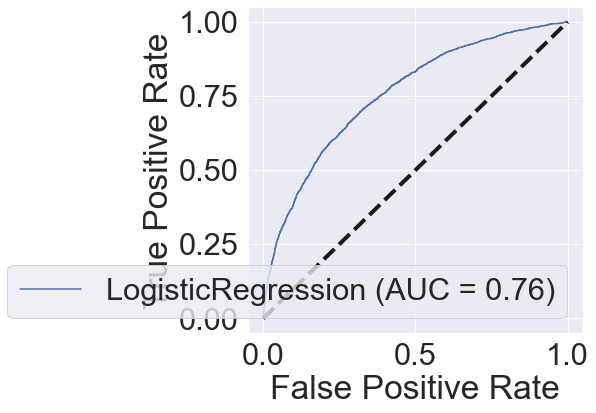

In [475]:
#Plot roc curve for Logistic regression with L2 penalty
fig, ax = plt.subplots(figsize=(6, 6))
plot_roc_curve(model_LR2, X_test, y_test, ax=ax)
ax.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.show()

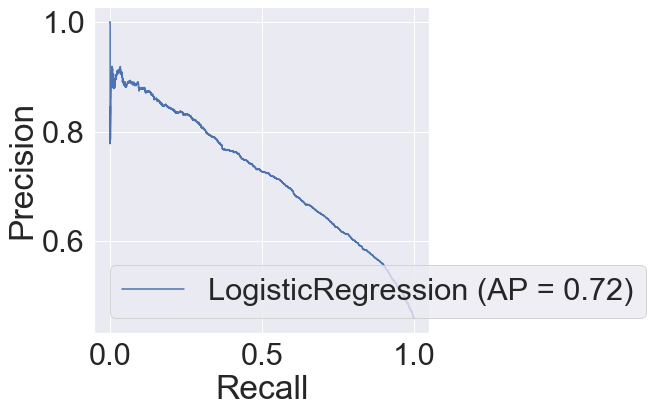

In [485]:
#Plot precision recall curve for Logistic regression with L2 penalty
fig, ax = plt.subplots(figsize=(6, 6))
plot_precision_recall_curve(model_LR2, X_test, y_test, ax=ax)
plt.show()

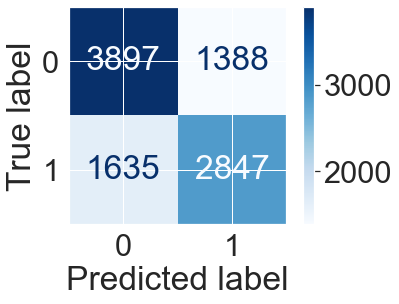

In [477]:
#Plot confusion matrix for Logistic regression with L2 penalty
plot_confusion_matrix(model_LR2, X_test, y_test, cmap='Blues', values_format='.0f')
plt.show()

In [480]:
#Plot coefficients for Logistic regression with L2 penalty
coefs_vars = pd.DataFrame({
    'coef': model_LR1.coef_[0],
    'variable': X1.columns,
    'abscoef': np.abs(model_LR1.coef_[0])
})
coefs_vars.sort_values('abscoef', ascending=True, inplace=True)
coefs_vars.plot(kind='barh', x='variable', y='coef',
                      color='r', figsize=(50, 300), label='Lasso')

plt.show()

<b> Fit and evaluate further models </b>

In [486]:
#Fit and evaluate Naive Bayes 
model_NB = naive_bayes.BernoulliNB()
model_NB.fit(X_train, y_train)
print(cross_val_score(model_NB, X_train, y_train, cv=5).mean())
print(model_NB.score(X_test, y_test))

0.6633564398896643
0.6663253813863008


In [487]:
#Fit and evaluate the decision tree classifier
classifier_DT = DecisionTreeClassifier(criterion='gini',
                                    max_depth=6, 
                                    random_state=1)
classifier_DT.fit(X_train, y_train)
print(classifier_DT.score(X_train, y_train))
print(cross_val_score(classifier_DT, X_train, y_train, cv=5).mean())
print(classifier_DT.score(X_test, y_test))

0.6998822565782737
0.6888245952361428
0.6924337053342889


In [488]:
#Fit and evaluate K Nearest Neighbours
knn = KNeighborsClassifier(n_neighbors = 200)
knn.fit(X_train, y_train)
print(knn.score(X_train, y_train))
print(cross_val_score(classifier, X_train, y_train, cv=5).mean())
print(knn.score(X_test, y_test))

0.5677280638886045
0.6888245952361428
0.5680352206409337


In [489]:
#Run a bagging classifier model
bc_dtc = BaggingClassifier(base_estimator=classifier_DT, n_estimators=100,
max_samples = 0.2, max_features = 1.0,
random_state=0).fit(X_train, y_train)

print(bc_dtc.score(X_train,y_train))
print(cross_val_score(classifier, X_train, y_train, cv=5).mean())
print(bc_dtc.score(X_test,y_test))

0.7278847138322924
0.6888245952361428
0.7176205590252892


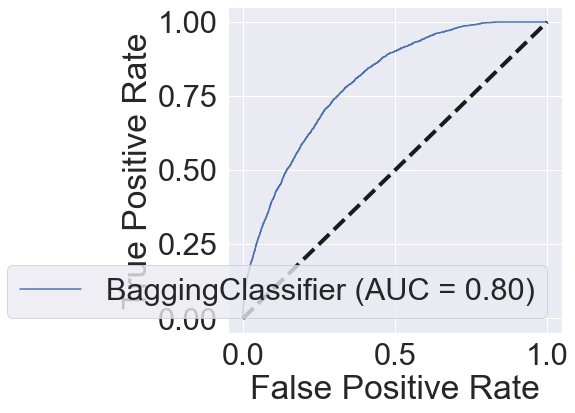

In [490]:
#plot roc curve for Bagging Classifier
fig, ax = plt.subplots(figsize=(6, 6))
plot_roc_curve(bc_dtc, X_test, y_test, ax=ax)
ax.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.show()

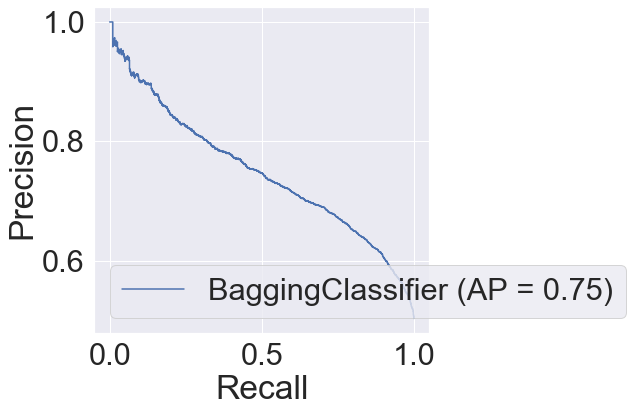

In [492]:
#plot precision recall curve for Bagging Classifier
fig, ax = plt.subplots(figsize=(6, 6))
plot_precision_recall_curve(bc_dtc, X_test, y_test, ax=ax)
plt.show()

In [493]:
#Print classification report for Bagging Classifier
predictions = bc_dtc.predict(X_test)
print(classification_report(y_test, predictions, digits=4))

              precision    recall  f1-score   support

           0     0.7474    0.7222    0.7346      5285
           1     0.6850    0.7122    0.6983      4482

    accuracy                         0.7176      9767
   macro avg     0.7162    0.7172    0.7165      9767
weighted avg     0.7188    0.7176    0.7180      9767



<b> Cluster analysis to determine new target classes </b>

In [63]:
df_s2 = pd.read_csv('df_s_num1.csv')

In [64]:
#group by class id for merging with student data frame
df_s_class = df_s2.groupby(by=df_s2.CLASSID).mean()

In [65]:
# create 'conf_agg' variable
df_s_class['conf_agg'] = df_s_class[['ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']].mean(axis=1)

In [66]:
df_s_dum = pd.get_dummies(df_s_class, columns = ['COUNTRYID'], drop_first=True)

In [67]:
# Create X variable to use in the cluster analysis, including all individual confidence variables
X = df_s_class[['ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]


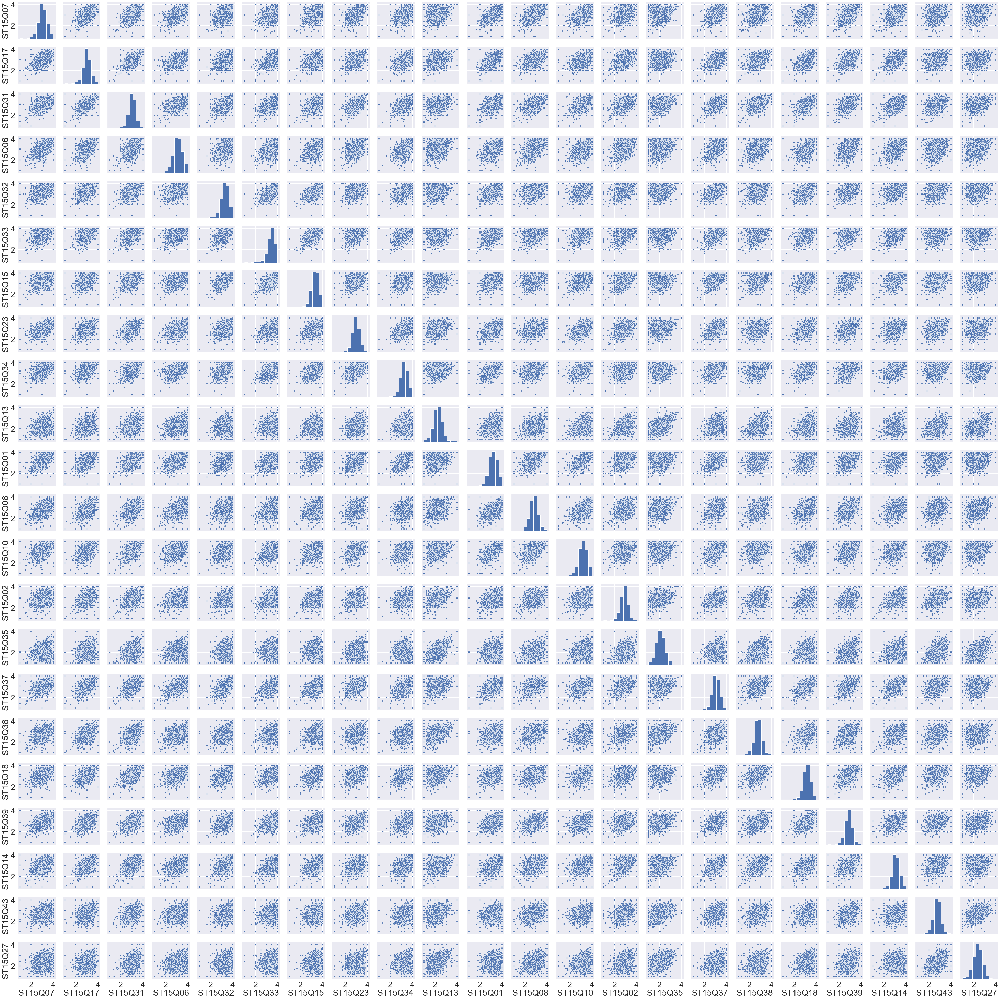

In [68]:
fig = sns.pairplot(X)

<b>Hierarchical Clustering</b>

In [116]:
def plot_dendogram(X,  color_threshold=100, leaf_rotation=90, leaf_font_size=8.,
                   method='ward', metric='euclidean', ax=None, figsize=(45,15)):

    # Data prep
    
    Z = linkage(X, method=method, metric=metric)
    
    # plotting
    if ax==None:
        fig, ax = plt.subplots(figsize=figsize)
        ax.set_title('Dendrogram')
        ax.set_xlabel('Index Numbers')
        ax.set_ylabel('Distance')
        dendrogram(
            Z,
            ax=ax,
            color_threshold=color_threshold, 
            leaf_rotation=leaf_rotation, 
            leaf_font_size=leaf_font_size
        )
    else:
        ax.set_title('Dendrogram')
        ax.set_xlabel('Index Numbers')
        ax.set_ylabel('Distance')
        dendrogram(
            Z,
            ax=ax,
            color_threshold=color_threshold, 
            leaf_rotation=leaf_rotation, 
            leaf_font_size=leaf_font_size
        )

    return ax
    
def plot_dist_thresh(X, max_value=100, color_threshold = 1, method='ward', metric='euclidean'):
    X = X.copy()
    Z = linkage(X, method=method, metric=metric)
    clusters = fcluster(Z, max_value, criterion='distance')
    X['label'] = clusters
    labels = np.sort(X.label.unique())
    print("Clusters represented at distance: ", labels)
    
    
    fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
    
    colors = plt.cm.Spectral(np.linspace(0, 1, len(labels)))
    
    for label, color in zip(np.sort(X.label.unique()), colors):
        X_sub = X[X.label == label]
        ax[0].scatter(X_sub.iloc[:,0], X_sub.iloc[:,1], s=70, 
                   color=color, label=label, alpha=0.9)
    
    ax[0].set_title("Max Value: %d" % max_value)
    
    ax[0].legend(loc=[2.5,0], shadow=True, scatterpoints=1)
    
    t = (0, 10000)
    
    ax[1].plot(t, (max_value, max_value), 'r--')
    ax[1] = plot_dendogram(X.iloc[:, :2], color_threshold=color_threshold, method=method, metric=metric, ax=ax[1])
    
    return fig, ax

def plot_wrapper(max_value):
    plot_dist_thresh(X.iloc[:, :2], max_value, color_threshold=1)
    plt.show()

Clusters represented at distance:  [1 2 3 4 5]


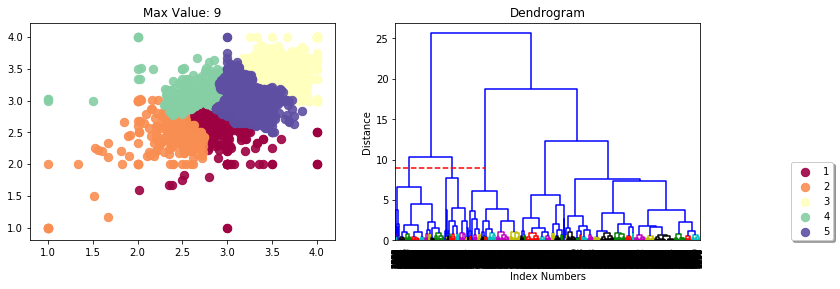

In [63]:
#plot clusters at distance 9, 1st and 2nd variables ('ST15Q07', 'ST15Q17')
fig, ax = plot_dist_thresh(X.iloc[:,:2], 9) 

Clusters represented at distance:  [1 2 3 4 5]


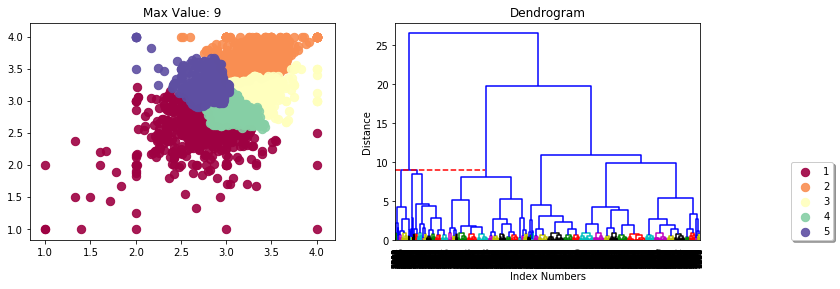

In [64]:
#plot clusters at distance 9, 3rd and 4th variables ('ST15Q31', 'ST15Q06')

fig, ax = plot_dist_thresh(X.iloc[:,2:4], 9) 

/Users/courtneyfroehlig/opt/anaconda3/lib/python3.7/site-packages/seaborn/matrix.py:624: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


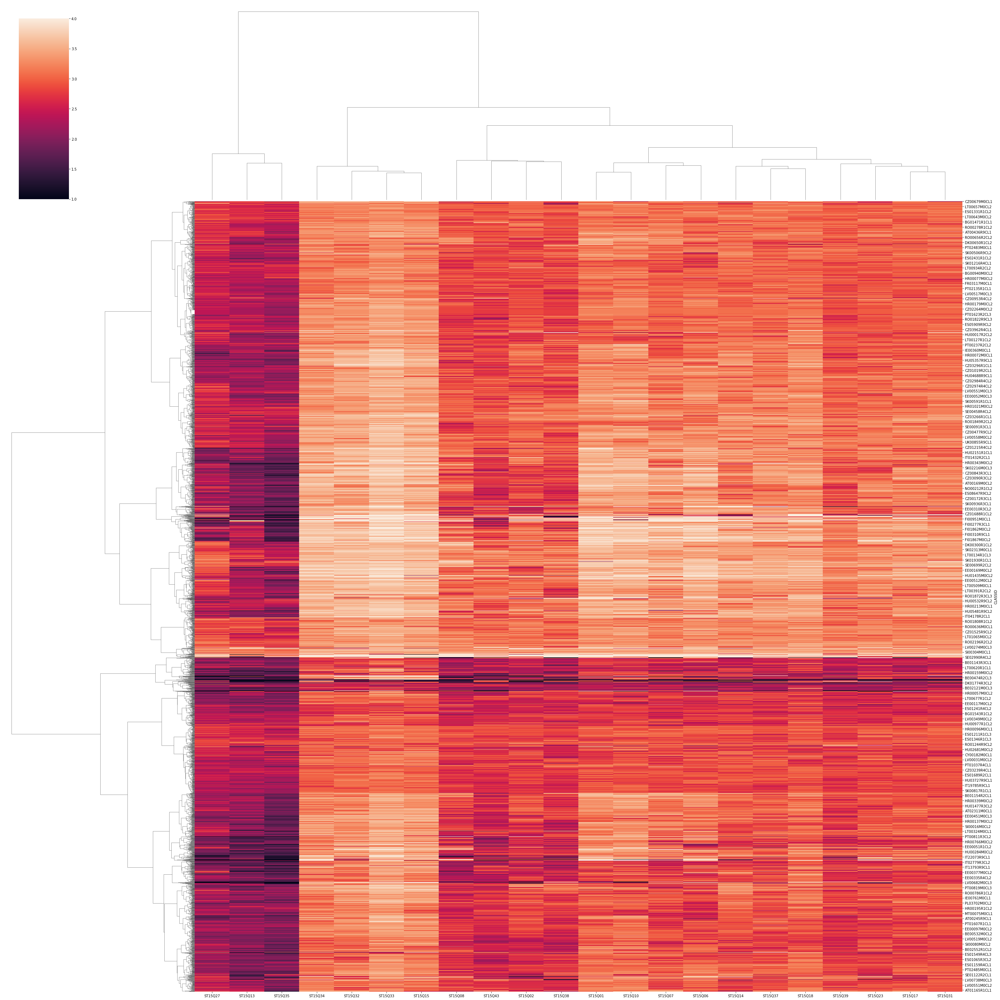

In [65]:
sns.clustermap(X, pivot_kws=None, method='ward', metric='euclidean', z_score=None, standard_scale=None, figsize=(40, 40), cbar_kws=None, row_cluster=True, col_cluster=True, row_linkage=None, col_linkage=None, row_colors=None, col_colors=None, mask=None, dendrogram_ratio=0.2, colors_ratio=0.03, cbar_pos=(0.02, 0.8, 0.05, 0.18), tree_kws=None)


In [69]:
Z = linkage(X, method="ward", metric="euclidean")

<b>Examining five clusters </b>

In [70]:
# Choose 5 clusters to get a better sense of the differences in groups at a more granular level than would be available with 2-3 groups
clusters = fcluster(Z, 5, criterion='maxclust')
np.unique(clusters).shape

(5,)

In [71]:
#change group labels so that they start from 0
clusters_trans = []
for i in clusters:
    if i == 1:
        clusters_trans.append(i-1)
    elif i == 2:
        clusters_trans.append(i-1)
    elif i == 3:
        clusters_trans.append(i-1)
    elif i == 4:
        clusters_trans.append(i-1)
    else: clusters_trans.append(4)

In [148]:
cluster_df = pd.DataFrame(clusters_trans, index=df_s_class.index, columns =['cluster_class'])

In [149]:
cluster_df.cluster_class.value_counts(normalize=True)

4    0.379971
0    0.312224
2    0.146686
1    0.118409
3    0.042710
Name: cluster_class, dtype: float64

Groups are very imbalanced, important to look at precision, accuracy, and f1 scores rather than just accuracy

In [183]:
#create a dataframe with student data and cluster groups identified (to be used as new target variable)
df_s_clust = pd.merge(left=df_s_class, right=cluster_df, left_on=df_s_class.index, right_on= cluster_df.index)

In [184]:
#set index 
df_s_clust.set_index('key_0', inplace=True)
# drop superfluous columns
df_s_clust.drop(columns = 'Unnamed: 0', inplace=True)
#dummify country ID
df_s_clust = pd.get_dummies(df_s_clust, columns = ['COUNTRYID'], drop_first= True)

In [170]:
#take a slice of the datafame to look specifically at average scores for each confidence variable across classes
df_s_clust_conf = df_s_clust[['cluster_class','ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]

In [186]:
df_s_clust_5groups_formodel = df_s_clust.drop(columns = conf_columns)

In [187]:
df_s_clust_5groups_formodel.drop(columns = 'conf_agg', inplace=True)

In [78]:
#Run f oneway tests to determine whether the means for each confidence variable are significantly different across classes
anova_scores =[]
for column in df_s_clust_conf.drop(columns = 'cluster_class').columns:
    score = stats.f_oneway(*[df_s_clust_conf[column][df_s_clust_conf.cluster_class == i] for i in [2, 3, 4]])
    anova_scores.append([column, score])

In [79]:
p_values_df = pd.DataFrame(anova_scores,columns=["Variable", "Statistic, P-value"])
p_values_df

,Variable,"Statistic, P-value"
0,ST15Q07,"(647.7874009936943, 5.713925267386729e-216)"
1,ST15Q17,"(796.3843199039458, 6.601245884111091e-253)"
2,ST15Q31,"(804.777811580056, 6.718427074373242e-255)"
3,ST15Q06,"(810.638120676066, 2.7656886288028357e-256)"
4,ST15Q32,"(494.74582069421916, 3.4779254694961196e-174)"
5,ST15Q33,"(349.90298536393846, 2.1698308326704573e-130)"
6,ST15Q15,"(334.69235518123617, 1.6319720476659608e-125)"
7,ST15Q23,"(605.6437168071501, 7.143234716891357e-205)"
8,ST15Q34,"(523.053707628868, 3.103861368153301e-182)"
9,ST15Q13,"(298.54755930503325, 1.0788720583889392e-113)"


In [80]:
#create a new data frame with only confidence variables and cluster class
df_s_clust_only_15 = df_s_clust[['cluster_class', 'ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]

In [84]:
#create a dataframe with standard deviations of each cluster class
df_s_clust_grouped_15_std = df_s_clust_only_15.groupby(by='cluster_class').std()
#create a list of stds for each cluster class
mean_list=[]
for i in df_s_clust_grouped_15_std.index:
    mean = df_s_clust_grouped_15_std[df_s_clust_grouped_15_std.index == i]
    mean_list.append([i, mean])

In [85]:
#great a dataframe with means of each cluster class
df_s_clust_grouped_15_mean = df_s_clust_only_15.groupby(by='cluster_class').mean()
#create a list of means for each cluster class
mean_list=[]
for i in df_s_clust_grouped_15_mean.index:
    mean = df_s_clust_grouped_15_mean[df_s_clust_grouped_15_mean.index == i]
    mean_list.append([i, mean])

In [86]:
slist = df_s_clust_conf.drop(columns = 'cluster_class').columns

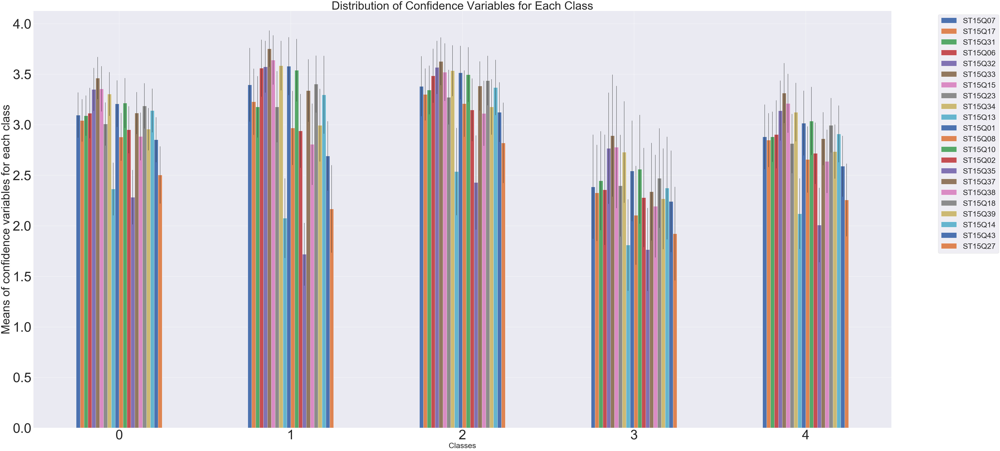

In [88]:
NUM_COLORS = len(slist)
cm = plt.get_cmap('prism')
df_s_clust_grouped_15_mean.plot.bar(yerr = df_s_clust_grouped_15_std)
plt.gcf().set_size_inches(80, 40)
plt.xlabel('Classes', size = 40)
plt.ylabel('Means of confidence variables for each class', size = 60)
plt.title('Distribution of Confidence Variables for Each Class', size = 60)
plt.xticks(size = 70, rotation=0)
plt.yticks(size = 70)

plt.legend(prop={'size':40}, bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

<b> Examining three clusters </b>

In [89]:
# Choose 3 clusters to compare with 3 groups
clusters_3groups = fcluster(Z, 3, criterion='maxclust')
np.unique(clusters_3groups).shape

(3,)

In [90]:
#change group labels so that they start from 0
clusters_trans_3 = []
for i in clusters_3groups:
    if i == 1:
        clusters_trans_3.append(i-1)
    elif i == 2:
        clusters_trans_3.append(i-1)
    else: clusters_trans_3.append(2)

In [91]:
cluster_df_3groups = pd.DataFrame(clusters_trans_3, index=df_s_class.index, columns =['cluster_class'])

In [92]:
#create a dataframe with student data and cluster groups identified (to be used as new target variable)
df_s_clust_3groups = pd.merge(left=df_s_class, right=cluster_df_3groups, left_on=df_s_class.index, right_on= cluster_df.index)

In [93]:
#set index 
df_s_clust_3groups.set_index('key_0', inplace=True)
# drop superfluous columns
df_s_clust_3groups.drop(columns = 'Unnamed: 0', inplace=True)
#dummify country ID
pd.get_dummies(df_s_clust_3groups, columns = ['COUNTRYID'], drop_first= True)

,N_Teachers_Part,N_Students_Part,N_Parents_Part,ST25Q01,ST22Q01,ST01Q01,ST01Q03,ST01Q04,ST02Q01,ST03Q01,...,COUNTRYID_22.0,COUNTRYID_23.0,COUNTRYID_24.0,COUNTRYID_25.0,COUNTRYID_26.0,COUNTRYID_27.0,COUNTRYID_28.0,COUNTRYID_29.0,COUNTRYID_30.0,COUNTRYID_31.0
key_0,,,,,,,,,,,,,,,,,,,,,
AT00010R9CL1,1.0,17.0,0.0,4.0,1.188133,1.006358,1.674293,1.000000,1.061621,1.835047,...,0,0,0,0,0,0,0,0,0,0
AT00013R9CL1,1.0,17.0,0.0,2.0,1.470588,1.117647,1.529412,1.000000,1.058824,2.658577,...,0,0,0,0,0,0,0,0,0,0
AT00169M0CL1,6.0,27.0,2.0,2.0,1.090909,1.100735,1.272727,1.000000,1.000000,2.090909,...,0,0,0,0,0,0,0,0,0,0
AT00169M0CL2,6.0,27.0,2.0,3.0,1.062500,1.000000,1.437500,1.000000,1.000000,3.437500,...,0,0,0,0,0,0,0,0,0,0
AT00183M0CL1,2.0,20.0,0.0,4.0,1.204956,1.205404,1.673149,1.052242,1.001189,1.909790,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UK02205R9CL1,0.0,25.0,0.0,2.0,1.043965,1.040000,1.240000,1.040000,1.000000,2.200000,...,0,0,0,0,0,0,0,0,0,1
UK02639R2CL2,4.0,24.0,4.0,2.0,1.087464,1.000000,1.163581,1.087070,1.000991,2.224650,...,0,0,0,0,0,0,0,0,0,1
UK03048R1CL1,3.0,20.0,0.0,3.0,1.000000,1.000000,1.246298,1.000000,1.000000,2.529370,...,0,0,0,0,0,0,0,0,0,1


In [94]:
#take a slice of the datafame to look specifically at average scores for each confidence variable across classes
df_s_clust_conf_3groups = df_s_clust_3groups[['cluster_class','ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]

In [109]:
#create a dataframe with standard deviations of each cluster class
df_s_clust_grouped_15_std_3groups = df_s_clust_conf_3groups.groupby(by='cluster_class').std()
#create a list of stds for each cluster class
mean_list=[]
for i in df_s_clust_grouped_15_mean.index:
    std = df_s_clust_grouped_15_mean[df_s_clust_grouped_15_mean.index == i]
    std_list.append([i, std])

In [96]:
#great a dataframe with means of each cluster class
df_s_clust_grouped_15_mean = df_s_clust_conf_3groups.groupby(by='cluster_class').mean()
#create a list of means for each cluster class
mean_list=[]
for i in df_s_clust_grouped_15_mean.index:
    mean = df_s_clust_grouped_15_mean[df_s_clust_grouped_15_mean.index == i]
    mean_list.append([i, mean])

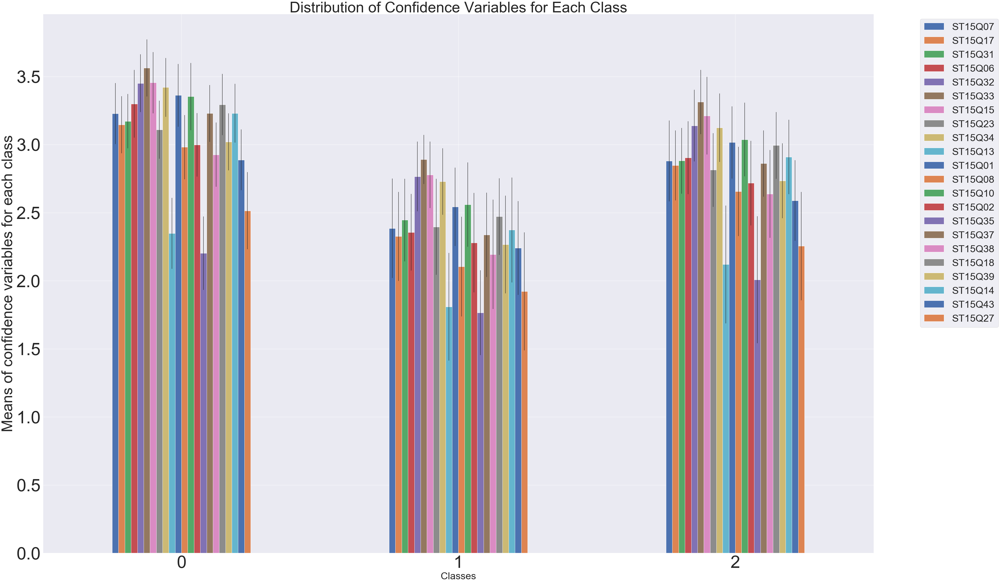

In [113]:
NUM_COLORS = len(slist)
cm = plt.get_cmap('prism')
df_s_clust_grouped_15_mean.plot.bar(yerr = df_s_clust_grouped_15_std)
plt.gcf().set_size_inches(60, 40)
plt.xlabel('Classes', size = 40)
plt.ylabel('Means of confidence variables for each class', size = 60)
plt.title('Distribution of Confidence Variables for Each Class', size = 60)
plt.xticks(size = 70, rotation=0)
plt.yticks(size = 70)

plt.legend(prop={'size':40}, bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

In [191]:
#Run f oneway tests to determine whether the means for each confidence variable are significantly different across classes
anova_scores =[]
for column in df_s_clust_conf_3groups.drop(columns = 'cluster_class').columns:
    score = stats.f_oneway(*[df_s_clust_conf_3groups[column][df_s_clust_conf_3groups.cluster_class == i] for i in [0, 1, 1]])
    anova_scores.append([column, score])
    
p_values_df = pd.DataFrame(anova_scores,columns=["Variable", "Statistic, P-value"])
p_values_df

,Variable,"Statistic, P-value"
0,ST15Q07,"(751.5256977306863, 1.2451891143438077e-250)"
1,ST15Q17,"(896.2373459003181, 6.607485739448315e-287)"
2,ST15Q31,"(751.2837218112642, 1.439486938870059e-250)"
3,ST15Q06,"(843.5052501361813, 5.349966087581204e-274)"
4,ST15Q32,"(605.3008589455637, 5.156776751341405e-211)"
5,ST15Q33,"(583.8185553470848, 6.5079351365171445e-205)"
6,ST15Q15,"(521.0037408897474, 1.269638458621422e-186)"
7,ST15Q23,"(617.7236583836108, 1.6548333791296229e-214)"
8,ST15Q34,"(646.7034518143921, 1.461521921244771e-222)"
9,ST15Q13,"(246.3334045005981, 1.8734049273806417e-97)"


<b> Examining two clusters </b>

In [100]:
# Choose 2 clusters
clusters_2 = fcluster(Z, 2, criterion='maxclust')
np.unique(clusters_2).shape

(2,)

In [101]:
#change group labels so that they start from 0
clusters_trans_2 = []
for i in clusters_2:
    if i == 1:
        clusters_trans_2.append(i-1)
    else: clusters_trans_2.append(1)

In [102]:
#create a dataframe with cluster labels
cluster_df_2groups = pd.DataFrame(clusters_trans_2, index=df_s_class.index, columns =['cluster_class'])

In [103]:
#determine proportion in each cluster
cluster_df_2groups.cluster_class.value_counts(normalize=True)

0    0.57732
1    0.42268
Name: cluster_class, dtype: float64

In [104]:
#create a dataframe with student data and cluster groups identified (to be used as new target variable)
df_s_clust_2groups = pd.merge(left=df_s_class, right=cluster_df_2groups, left_on=df_s_class.index, right_on= cluster_df_2groups.index)

In [105]:
#set index 
df_s_clust_2groups.set_index('key_0', inplace=True)
# drop superfluous columns
df_s_clust_2groups.drop(columns = ['Unnamed: 0', 'conf_agg'], inplace=True)
#dummify country ID
df_s_clust_2groups_formodel= pd.get_dummies(df_s_clust_2groups, columns = ['COUNTRYID'], drop_first= True)

In [106]:
#take a slice of the datafame to look specifically at average scores for each confidence variable across classes
df_s_clust_conf_2groups = df_s_clust_2groups[['cluster_class','ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]

In [110]:
#create a dataframe with standard deviations of each cluster class
df_s_clust_grouped_15_std_2groups = df_s_clust_conf_2groups.groupby(by='cluster_class').std()
#create a list of stds for each cluster class
std_list=[]
for i in df_s_clust_grouped_15_std_2groups.index:
    std = df_s_clust_grouped_15_std_2groups[df_s_clust_grouped_15_std_2groups.index == i]
    std_list.append([i, std])

In [111]:
#great a dataframe with means of each cluster class
df_s_clust_grouped_15_mean_2groups = df_s_clust_conf_2groups.groupby(by='cluster_class').mean()
#create a list of means for each cluster class
mean_list_2groups=[]
for i in df_s_clust_grouped_15_mean_2groups.index:
    mean = df_s_clust_grouped_15_mean_2groups[df_s_clust_grouped_15_mean_2groups.index == i]
    mean_list_2groups.append([i, mean])

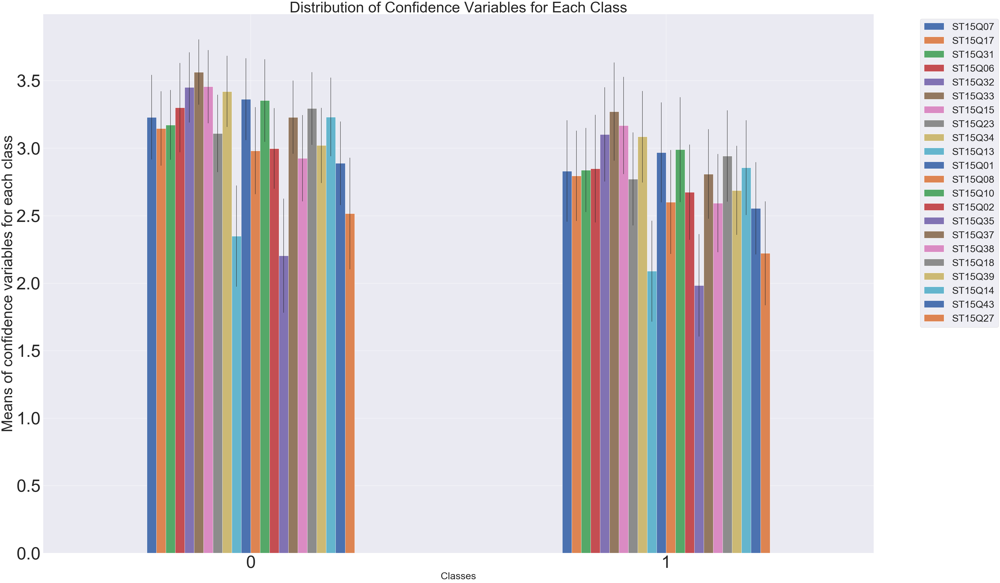

In [112]:
NUM_COLORS = len(slist)
cm = plt.get_cmap('prism')
df_s_clust_grouped_15_mean_2groups.plot.bar(yerr = df_s_clust_grouped_15_std_2groups)
plt.gcf().set_size_inches(60, 40)
plt.xlabel('Classes', size = 40)
plt.ylabel('Means of confidence variables for each class', size = 60)
plt.title('Distribution of Confidence Variables for Each Class', size = 60)
plt.xticks(size = 70, rotation=0)
plt.yticks(size = 70)

plt.legend(prop={'size':40}, bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

After studying the differences between 5, 3, and 2, clusters, it seemed that using five clusters helped to shed more granular insights into the data (i.e. that there might be more nuanced distinctions between classrooms' digital confidence besides just low/(medium)/high). For example: Group 2 had higher variability between lows and highs, very low confidence with coding & creating websites, highest on using mobile applications/social media. Group 3 was consistently high among variables, with higher scores on coding and creating websites. Group 4 was consistently low overall - low on both coding/programming/creating websites and social media/communication.

Therefore, I decided to use these five clusters as my target variable to see if using these clusters as classes helped the predictive model to improve in accuracy and could help shed insights about what factors might predict these distinct classes (especially groups 2, 3, and 4). 

<b>Second stage of modelling with five cluster classes as target variable</b>

In [189]:
y2 = df_s_clust_5groups_formodel.pop('cluster_class')

In [190]:
X2 = df_s_clust_5groups_formodel

In [191]:
X2_train, X2_test, y2_train, y2_test = train_test_split(
    X2, y2, test_size=0.2,
    stratify=y2, random_state=1)

scaler = MinMaxScaler()
X2_train = scaler.fit_transform(X2_train)
X2_test = scaler.transform(X2_test)

In [192]:
#Run a Logistic Regression model without any penalty first, fit on traindata, cross-validate, calculate score on test data
model = LogisticRegression(penalty='none', max_iter=10000)
model.fit(X2_train, y2_train)
scores = cross_val_score(model, X2_train, y2_train, cv=5)

print(model.score(X2_train, y2_train))
print(scores)
print(np.mean(scores))
print(model.score(X2_test, y2_test))

0.6189248895434463
[0.45955882 0.45488029 0.45856354 0.47882136 0.50644567]
0.4716539378182212
0.5066273932253313


In [438]:
model_e = LogisticRegression(solver = 'saga', penalty='elasticnet', l1_ratio=.5, max_iter=8000, multi_class='ovr')
model_e.fit(X2_train, y2_train)
scores = cross_val_score(model_e, X2_train, y2_train, cv=5)

print(model_e.score(X2_train, y2_train))
print(scores)
print(np.mean(scores))
print(model_e.score(X2_test, y2_test))
probabilities = model_e.predict_proba(X2_test)

0.5894698085419735
[0.51102941 0.48987109 0.46777164 0.49907919 0.5267035 ]
0.4988909652258693
0.5257731958762887


In [322]:
predictions = model_e.predict(X2_test)

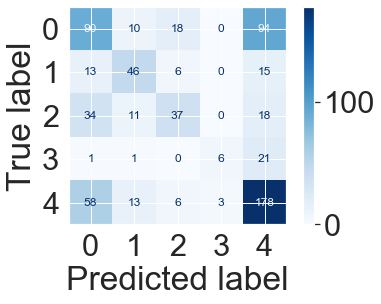

In [368]:
#Plot confusion matrix for Logistic Regression with elastic net
plot_confusion_matrix(model_e, X2_test, y2_test, cmap='Blues', values_format='.0f')
plt.show()

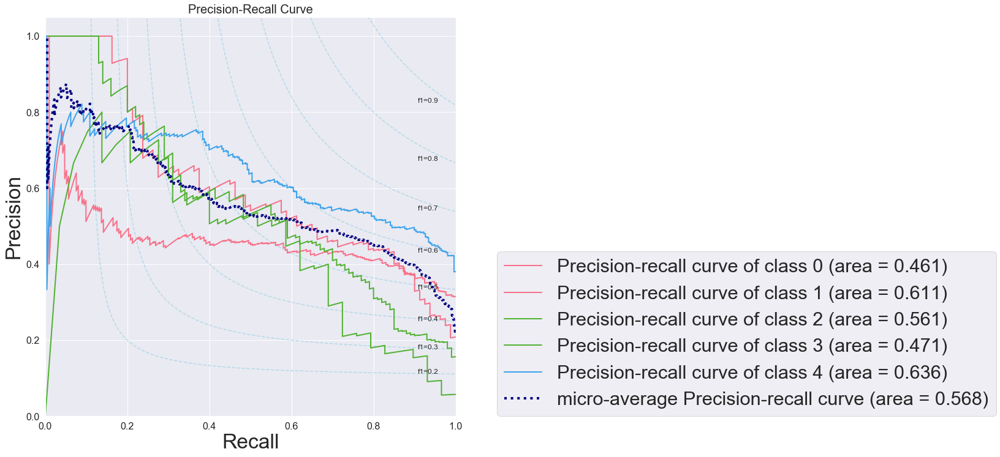

In [337]:
def plot_f1_lines(figsize=(8,6),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=(12,12))
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=12)

    return fig, ax



fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y2_test, probabilities, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()


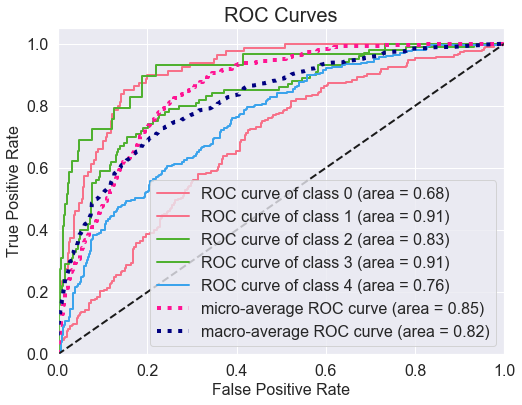

In [324]:
skplt.metrics.plot_roc(y2_test, probabilities, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

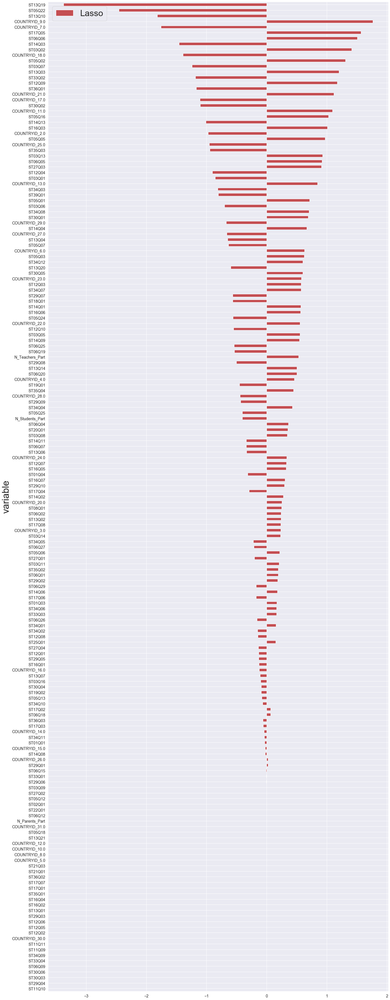

In [439]:
#Examine coefficients for class 1 (varied confidence class)
coefs_vars = pd.DataFrame({
    'coef': model_e.coef_[1],
    'variable': X2.columns,
    'abscoef': np.abs(model_e.coef_[1])
})
coefs_vars.sort_values('abscoef', ascending=True, inplace=True)
coefs_vars.plot(kind='barh', x='variable', y='coef',
                      color='r', figsize=(20, 50), label='Lasso', fontsize=14)

plt.savefig('coefficients_model_5group')
plt.tight_layout()
plt.show()

<u>The following features were associated with being in class 1:</u>

Top negative coefficients: <br>
ST13Q09: How often are you engaged in Code/programming apps, programmes and/or robots in classroom <br>
ST05Q22: How often do you take part in the following activities in your free time, at home or any place other than school? Coding and programming apps, programmes and/or robots<br>
Country ID 7: Denmark

Top Positive coefficients: <br>
ST05Q02 How often do you spend time Chatting online (e.g.  WhatsApp, Viber, Google Hangouts, Facebook messenger, Skype messenger, etc.) in your free time?<br>
Country ID 9: Finland

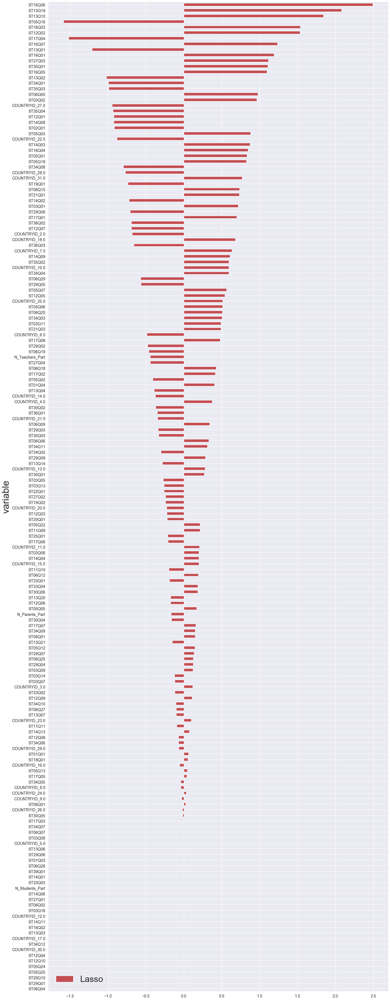

In [440]:
#Examine coefficients for class 2 (consistently high confidence class)
coefs_vars = pd.DataFrame({
    'coef': model_e.coef_[2],
    'variable': X2.columns,
    'abscoef': np.abs(model_e.coef_[2])
})
coefs_vars.sort_values('abscoef', ascending=True, inplace=True)
coefs_vars.plot(kind='barh', x='variable', y='coef',
                      color='r', figsize=(20, 50), label='Lasso', fontsize=14)

plt.savefig('coefficients_model_5group')
plt.tight_layout()
plt.show()

<u>The following features were associated with being in class 2:</u>

Top negative coefficients:<br>
ST05Q16: Participate in social networks (e.g. Facebook, Instagram, Twitter, Snapchat, Ask.fm, etc.) <br>
ST35Q03: My school encourages me to use ICT to learn by doing instead of just listening to lectures<br>
ST17Q04: I lose track of time when I'm learning with the computer

Top positive coefficients:<br>
ST1606: ICT enables you to work better with other students on tasks<br>
ST13Q19/Q10: Code/programme apps, programmes and/or robots/Participate in online training  programmes during lessons<br>
ST12Q02: Use software, online quizzes and tests<br>
ST16Q03: Does ICT make you feel more independent in your learning?<br>
ST06Q05  Use other online tools on a computer ( e.g. Viber, Google Hangouts, Facebook, Skype, etc.) to contact other students about schoolwork<br>
ST35Q01 My school encourages me to use my digital skills in a variety of learning activities<br>
ST05Q03 How often do you read and watch the news online at home?<br>

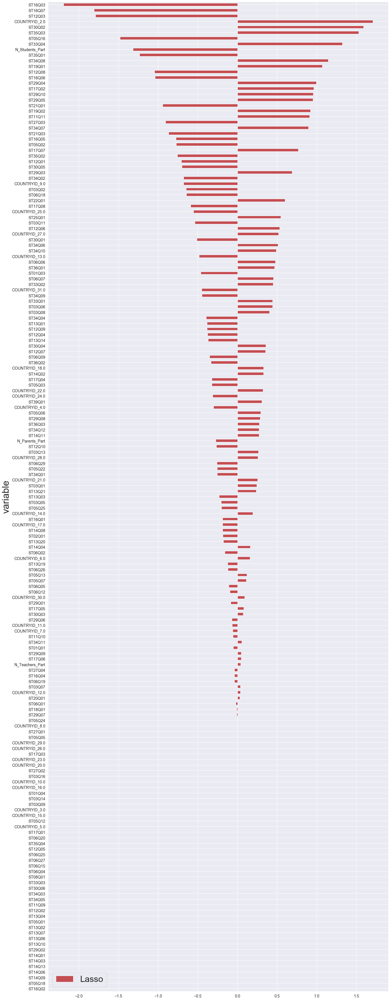

In [443]:
#Examine coefficients for group 4 (consistently low confidence class)
coefs_vars = pd.DataFrame({
    'coef': model_e.coef_[3],
    'variable': X2.columns,
    'abscoef': np.abs(model_e.coef_[3])
})
coefs_vars.sort_values('abscoef', ascending=True, inplace=True)
coefs_vars.plot(kind='barh', x='variable', y='coef',
                      color='r', figsize=(20, 50), label='Lasso', fontsize=14)

plt.savefig('coefficients_model_5group')
plt.tight_layout()
plt.show()

<u>The following features were associated with being in class 3 (lowest confidence):</u>

Top negative coefficients:<br>
ST16Q03: using technology during lessons helps me to feel more independent in my learning<br>
ST12Q03 How often do you use the following in lessons: Multimedia production tools (e.g. PowerPoint, video editing, digital recording)<br>
ST16Q07 ICT improves the atmosphere in class (students are more engaged, there is less disruption)<br>
ST35Q01 My school encourages me to use my digital skills in a variety of learning activities<br>
ST16Q06: ICT enables you to work better with other students on tasks<br>

Top positive coefficients:<br>
Country ID 2: Belgium <br>
ST35Q03 My school encourages me to use ICT to learn by doing instead of just listening to lectures, positively associated with being a part of this group <br>
ST30Q02 How do you know the information you read is reliable? I double check with another source<br>
ST33Q04: How often do you use the following at school for learning? Internet



In [350]:
#Model with a support vector machine (SVM)
model_rbf = SVC(kernel='rbf', C = 2.1544346900318843, gamma=0.0774263682681127, class_weight=None)

In [352]:
def get_accuracy(model, X_train, y_train, X_test, y_test, cv=5):
    model.fit(X_train, y_train)
    scores_train = cross_val_score(model, X_train, y_train, cv=cv, n_jobs=8)
    predictions_test = model.predict(X_test)
    sm = scores_train.mean()
    print("Average training score: {:0.3}".format(sm))
    print("Test score: {:0.3}".format(model.score(X_test, y_test)))
    return predictions_test


def print_cm_cr(y_true, y_pred):
    """prints the confusion matrix and the classification report"""
    confusion = pd.crosstab(y_true, y_pred, rownames=['Actual'], colnames=[
                            'Predicted'], margins=True)
    print(confusion)
    print()
    print(metrics.classification_report(y_true, y_pred))

In [353]:
predictions = get_accuracy(model_rbf, X2_train, y2_train, X2_test, y2_test, cv=5)

Average training score: 0.53
Test score: 0.564


In [354]:
print_cm_cr(y2_test, predictions)

Predicted    0   1   2  3    4  All
Actual                             
0          113  13   8  1   77  212
1           15  50   3  0   12   80
2           36  11  35  0   18  100
3            1   1   0  7   20   29
4           58  15   6  1  178  258
All        223  90  52  9  305  679

              precision    recall  f1-score   support

           0       0.51      0.53      0.52       212
           1       0.56      0.62      0.59        80
           2       0.67      0.35      0.46       100
           3       0.78      0.24      0.37        29
           4       0.58      0.69      0.63       258

    accuracy                           0.56       679
   macro avg       0.62      0.49      0.51       679
weighted avg       0.58      0.56      0.56       679



Try fitting other models

In [356]:
# fit and evaluate the decision tree classifier
classifier = DecisionTreeClassifier(criterion='gini',
                                    max_depth=6, 
                                    random_state=1)
classifier.fit(X2_train, y2_train)
print(classifier.score(X2_train, y2_train))
print(cross_val_score(classifier, X2_train, y2_train, cv=5).mean())
print(classifier.score(X2_test, y2_test))

0.6019882179675994
0.4466173762322609
0.46097201767304863


In [362]:
#fit a tensorflow-keras (neural network) network
model = tf.keras.Sequential([
    tf.keras.layers.Dense(200, activation='relu', 
                          input_shape=(X2_train.shape[1], )),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dense(5, activation ='softmax')
])

optimizer = tf.keras.optimizers.SGD(learning_rate=0.001)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30, 
                                              restore_best_weights=True)

EPOCHS = 1000

history = model.fit(
  X2_train, y2_train.values,
  epochs=EPOCHS, validation_split = 0.2, verbose=0, callbacks=[early_stop])

In [364]:
#Evaluate the model
model.evaluate(X2_test, y2_test.values, verbose=2)

22/22 - 0s - loss: 1.0471 - accuracy: 0.5479


[1.047098159790039, 0.5478644967079163]

In [369]:
bagdt = BaggingClassifier(DecisionTreeClassifier(),max_samples=0.5, max_features=1, n_estimators=100)
bag_params = {'base_estimator__max_depth' : [None], 'n_estimators': [100, 250, 500], 'max_features':[0.5, 1.0] }
gridsearch = GridSearchCV(bagdt,
                          bag_params,
                          n_jobs=2, 
                          cv=5, 
                          verbose=1)
gridsearch.fit(X2_train, y2_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  30 out of  30 | elapsed:  7.3min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                                               class_weight=None,
                                                                               criterion='gini',
                                                                               max_depth=None,
                                                                               max_features=None,
                                                                               max_leaf_nodes=None,
                                                                               min_impurity_decrease=0.0,
                                                                               min_impurity_split=None,
                                                                               min_samples_leaf=1,
                                                                         

In [370]:
gridsearch.best_score_

0.5312845303867404

In [371]:
model = GradientBoostingClassifier(
    n_estimators=100,
    criterion='mse',
    loss='deviance',
    max_depth=3,
    learning_rate=1.0,
    random_state=1)

model.fit(X2_train, y2_train)

print(model.score(X2_train, y2_train))
print(cross_val_score(model, X2_train, y2_train, cv=5).mean())
print(model.score(X2_test, y2_test))

1.0
0.47752884302892423
0.5125184094256259


<b>Try k-means clustering to determine the optimal number of clusters</b>

Although I chose 5 clusters for the second stage of modelling, I was interested in evaluating the number of clusters further to ensure that I was being rigourous in my thinking about determing the most appropriate number of clusters. Therefore, I conducted a k-means clustering analysis in order to utilise the elbow plot and silhouette methods as validation metrics. In general, the elbow plot method is more of a hueristic while the Silhouette method is used to study the separation distance between the resulting clusters.

In [227]:
kmeans = KMeans(n_clusters=5)

y = kmeans.fit_predict(df_s_class[['ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]
)

df_s_class['Cluster'] = y

df_s_class.Cluster.unique()

array([0, 1, 2, 3, 4], dtype=int32)

In [116]:
inertia_scores =[]
for i in range (1, 20):
    model = KMeans(n_clusters=i, random_state=0)
    model.fit(X)
    inertia_scores.append([model.inertia_, i])
    

In [117]:
import matplotlib.pyplot as plt

In [120]:
inertia_scores

[[10297.023169926077, 1],
 [7854.399034707781, 2],
 [7058.451975199279, 3],
 [6586.034466054941, 4],
 [6235.056723496721, 5],
 [5983.05429447201, 6],
 [5820.973490417433, 7],
 [5691.744948624002, 8],
 [5577.557482785895, 9],
 [5476.747816910515, 10],
 [5403.755011492929, 11],
 [5339.144019339406, 12],
 [5275.892466232447, 13],
 [5218.501145903542, 14],
 [5169.358307493613, 15],
 [5111.233023334337, 16],
 [5064.550510484808, 17],
 [5020.6894646621895, 18],
 [4979.07172832468, 19]]

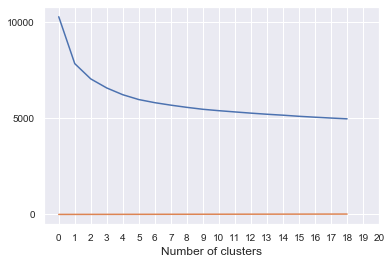

In [119]:
plt.plot(inertia_scores)
plt.xticks(range(0, 21))
plt.xlabel('Number of clusters', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

I looked at an elbow plot to get an idea of what the optimal number of clusters would be for the dataset. The 'elbow' (i.e. the point after which the SSE drops rapidly, afterwhich decreases in inertia are considerably more marginal than for previous increases in number of clusters) looks to be between 1 and 2 clusters. However, this is somewhat ambigous, as the SSE still decreases significantly for each additional cluster after the elbow. 

In [223]:
labels = kmeans.labels_

In [224]:
labels.shape

(3395,)

In [225]:
#silhouette score for 5 clusters
silhouette_score(X, labels, metric='euclidean')

0.10998538716481893

In [232]:
from matplotlib.colors import ListedColormap
from scikitplot.metrics import plot_silhouette
import matplotlib.cm as cm

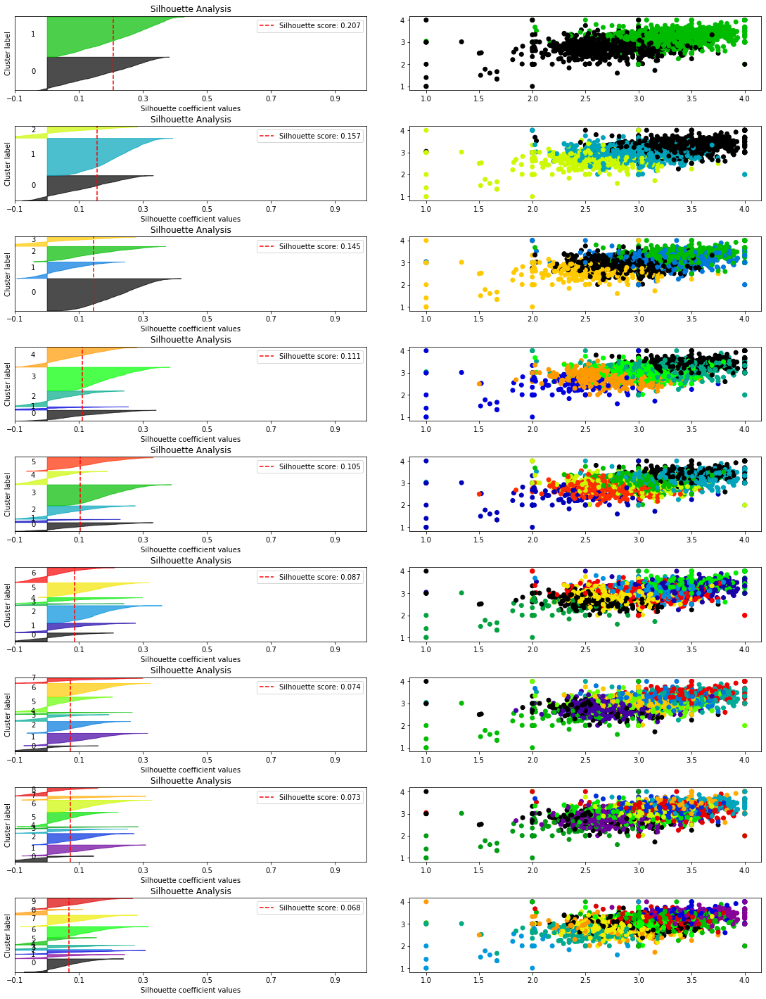

In [237]:
#Silhouette plot to examine silhouette coefficient values for varying number of clusters
silhouette = []

fig, ax = plt.subplots(nrows=9, ncols=2, figsize=(16, 20))
fig.tight_layout(pad=3.0)

for k in range(2, 11):

    model = KMeans(n_clusters=k, random_state=1)
    labels = model.fit_predict(X)
    silhouette.append((k, silhouette_score(X, labels.astype(float) / k)))

    colors = cm.nipy_spectral(labels.astype(float) / k)
    plot_silhouette(X, labels, ax=ax[k-2, 0])
    ax[k-2, 1].scatter(X.iloc[:, 0], X.iloc[:, 2], color=colors)

silhouette = np.array(silhouette)

Two groups provides the best silhouette coefficient (.207), compared to .111 for five groups.

<b>Use 2 clusters for k-means for modelling</b>

In [228]:
kmeans = KMeans(n_clusters=2)

y = kmeans.fit_predict(df_s_class[['ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27']]
)

df_s_class['Cluster'] = y

df_s_class.Cluster.unique()

array([1, 0], dtype=int32)

In [229]:
labels = kmeans.labels_

In [268]:
#create a data frame with new cluster labels based on k-means = 2
cluster_df_kmeans_2groups = pd.DataFrame(labels, index=df_s_class.index, columns =['cluster_class'])

In [280]:
cluster_df_kmeans_2groups.cluster_class.value_counts(normalize=True)

1    0.546392
0    0.453608
Name: cluster_class, dtype: float64

In [269]:
#create a dataframe with student data and cluster groups identified (to be used as new target variable)
df_s_clust_kmeans_2groups = pd.merge(left=df_s_class, right=cluster_df_2groups, left_on=df_s_class.index, right_on= cluster_df_2groups.index)

In [270]:
# drop superfluous columns
df_s_clust_kmeans_2groups.drop(columns = ['Unnamed: 0', 'Cluster'], inplace=True)
#dummify country ID
df_s_clust_kmeans_2groups = pd.get_dummies(df_s_clust_kmeans_2groups, columns = ['COUNTRYID'], drop_first= True)
#set index 
df_s_clust_kmeans_2groups.set_index('key_0', inplace=True)

In [271]:
#drop confidence columns
df_s_clust_kmeans_2groups_formodel = df_s_clust_kmeans_2groups.drop(columns = conf_columns)

In [272]:
#drop confidence aggregate columns
df_s_clust_kmeans_2groups_formodel.drop(columns = 'conf_agg', inplace=True)

In [275]:
#create target variable
y3 = df_s_clust_kmeans_2groups_formodel.pop('cluster_class')

In [276]:
#create predictor variable
X3 = df_s_clust_kmeans_2groups_formodel

In [278]:
#Train test split and scale data
X3_train, X3_test, y3_train, y3_test = train_test_split(
    X3, y3, test_size=0.2,
    stratify=y3, random_state=1)

scaler = MinMaxScaler()
X3_train = scaler.fit_transform(X3_train)
X3_test = scaler.transform(X3_test)

In [279]:
#Run a logistic regresion model to see how using two clusters from k-means compares to modelling with low/high confidence groups
model_e = LogisticRegression(solver = 'saga', penalty='elasticnet', l1_ratio=.5, max_iter=8000)
model_e.fit(X3_train, y3_train)
scores = cross_val_score(model_e, X3_train, y3_train, cv=5)

print(model_e.score(X3_train, y3_train))
print(scores)
print(np.mean(scores))
print(model_e.score(X3_test, y3_test))
probabilities = model_e.predict_proba(X3_test)

0.7540500736377025
[0.71507353 0.73112339 0.7053407  0.74217311 0.73296501]
0.7253351478713033
0.6907216494845361


<b> Based on these evaluation methods, I decided to try modelling (i.e. predicting confidence) firstly using two clusters (from the hierarchical clustering method), to compare these clusters to the initial modelling using the low/high confidence groups.</b>

In [273]:
y3 = df_s_clust_2groups_formodel.pop('cluster_class')

In [281]:
df_s_clust_2groups_formodel.drop(columns = ['ST15Q07', 'ST15Q17', 'ST15Q31', 'ST15Q06', 'ST15Q32', 'ST15Q33', 'ST15Q15', 'ST15Q23', 'ST15Q34', 'ST15Q13', 'ST15Q01', 'ST15Q08', 'ST15Q10', 'ST15Q02', 'ST15Q35', 'ST15Q37', 'ST15Q38', 'ST15Q18', 'ST15Q39', 'ST15Q14', 'ST15Q43', 'ST15Q27'], inplace=True)

In [282]:
X3 = df_s_clust_2groups_formodel

In [284]:
X3_train, X3_test, y3_train, y3_test = train_test_split(
    X3, y3, test_size=0.2,
    stratify=y3, random_state=1)

scaler = MinMaxScaler()
X3_train = scaler.fit_transform(X_train)
X3_test = scaler.transform(X_test)

In [420]:
model_e = LogisticRegression(solver = 'saga', penalty='elasticnet', l1_ratio=.5, max_iter=8000, multi_class='ovr')
model_e.fit(X3_train, y3_train)
scores = cross_val_score(model_e, X3_train, y3_train, cv=5)

print(model_e.score(X3_train, y3_train))
print(scores)
print(np.mean(scores))
print(model_e.score(X3_test, y3_test))
probabilities = model_e.predict_proba(X3_test)

0.7540500736377025
[0.71507353 0.73112339 0.7053407  0.74217311 0.73296501]
0.7253351478713033
0.6907216494845361


In [421]:
predictions = model_e.predict(X3_test)

In [422]:
print(classification_report(y3_test, predictions, digits=4))

              precision    recall  f1-score   support

           0     0.7146    0.7730    0.7426       392
           1     0.6510    0.5784    0.6125       287

    accuracy                         0.6907       679
   macro avg     0.6828    0.6757    0.6776       679
weighted avg     0.6877    0.6907    0.6877       679



In [286]:
# fit and evaluate the decision tree classifier
classifier = DecisionTreeClassifier(criterion='gini',
                                    max_depth=6, 
                                    random_state=1)
classifier.fit(X3_train, y3_train)
print(classifier.score(X3_train, y3_train))
print(cross_val_score(classifier, X3_train, y3_train, cv=5).mean())
print(classifier.score(X2_test, y3_test))


0.7912371134020618
0.6605344762214278
0.6318114874815906


Utilising two clusters as the target classes provided similar accuracy scores to the first phase of modelling with low/high confidence groups.

<b> Adding in teacher survey data to test if these additional predictors improve the model accuracy, starting with two clusters (from k-means clustering) as target variable </b>

In [390]:
df_t_class = df_t.groupby(by=df_t.CLASSID).mean()

In [391]:
#Merge teacher and student data into one dataframe
df_TS = pd.merge(left=df_s_class, right=df_t_class, left_on=df_s_class.index, right_on= df_t_class.index)

In [394]:
df_TS.columns.to_list()

['key_0',
 'Unnamed: 0_x',
 'COUNTRYID_x',
 'N_Teachers_Part_x',
 'N_Students_Part_x',
 'N_Parents_Part_x',
 'ST25Q01',
 'ST22Q01',
 'ST01Q01',
 'ST01Q03',
 'ST01Q04',
 'ST02Q01',
 'ST03Q01',
 'ST03Q02',
 'ST03Q05',
 'ST03Q06',
 'ST03Q07',
 'ST03Q08',
 'ST03Q09',
 'ST03Q14',
 'ST03Q13',
 'ST03Q11',
 'ST03Q16',
 'ST27Q01',
 'ST27Q02',
 'ST27Q03',
 'ST27Q04',
 'ST05Q03',
 'ST05Q05',
 'ST05Q06',
 'ST05Q12',
 'ST06Q12',
 'ST05Q01',
 'ST05Q16',
 'ST05Q02',
 'ST05Q18',
 'ST05Q13',
 'ST05Q22',
 'ST05Q24',
 'ST05Q25',
 'ST05Q07',
 'ST29Q01',
 'ST29Q02',
 'ST29Q06',
 'ST29Q10',
 'ST29Q03',
 'ST29Q04',
 'ST29Q05',
 'ST29Q07',
 'ST29Q08',
 'ST29Q09',
 'ST30Q01',
 'ST30Q02',
 'ST30Q03',
 'ST30Q04',
 'ST30Q05',
 'ST30Q06',
 'ST06Q02',
 'ST06Q09',
 'ST06Q04',
 'ST06Q05',
 'ST06Q18',
 'ST06Q06',
 'ST06Q07',
 'ST06Q19',
 'ST06Q20',
 'ST06Q25',
 'ST06Q01',
 'ST06Q26',
 'ST06Q27',
 'ST06Q29',
 'ST06Q15',
 'ST08Q01',
 'ST33Q01',
 'ST33Q02',
 'ST33Q03',
 'ST33Q04',
 'ST34Q01',
 'ST34Q02',
 'ST34Q03',
 'ST

In [395]:
df_TS.drop(columns=['Unnamed: 0_x', 'Unnamed: 0_y' , 'TSC_7477','FSTWT', 'conf_agg','COUNTRYID_y','CNT','EU','LEVEL','WAVE','N_Teachers_Part_y','N_Students_Part_y','N_Parents_Part_y'], inplace= True)

In [397]:
df_TS.set_index('key_0', drop=True, inplace=True)

In [400]:
df_TS.drop(columns = conf_columns, inplace=True)

In [401]:
df_TS = pd.get_dummies(df_TS, columns = ['COUNTRYID_x'], drop_first=True)

In [407]:
y4 = df_TS.pop('Cluster')

In [408]:
X4 = df_TS

In [410]:
X4_train, X4_test, y4_train, y4_test = train_test_split(
    X4, y4, test_size=0.2,
    stratify=y4, random_state=1)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X4_train)
X_test = scaler.transform(X4_test)

In [429]:
model_e = LogisticRegression(solver = 'saga', penalty='elasticnet', l1_ratio=.5, max_iter=8000, multi_class='ovr')
model_e.fit(X4_train, y4_train)
scores = cross_val_score(model_e, X4_train, y4_train, cv=5)

print(model_e.score(X4_train, y4_train))
print(scores)
print(np.mean(scores))
print(model_e.score(X4_test, y4_test))
probabilities = model_e.predict_proba(X4_test)

0.795641447368421
[0.7063655  0.73305955 0.72222222 0.7345679  0.74279835]
0.7278027057401915
0.7417763157894737


Adding in teacher survey data into the predictive model improves the model accuracy by a little over 5%.

In [412]:
# fit and evaluate the decision tree classifier
classifier = DecisionTreeClassifier(criterion='gini',
                                    max_depth=6, 
                                    random_state=1)
classifier.fit(X4_train, y4_train)
print(classifier.score(X4_train, y4_train))
print(cross_val_score(classifier, X4_train, y4_train, cv=5).mean())
print(classifier.score(X4_test, y4_test))


0.8186677631578947
0.638571585502911
0.7006578947368421


In [415]:
predictions = model_e.predict(X4_test)

In [418]:
print(classification_report(y4_test, predictions, digits=4))

              precision    recall  f1-score   support

           0     0.7096    0.7122    0.7109       271
           1     0.7679    0.7656    0.7667       337

    accuracy                         0.7418       608
   macro avg     0.7387    0.7389    0.7388       608
weighted avg     0.7419    0.7418    0.7418       608



In [430]:
model_e.coef_

array([[-2.20149447e-02, -1.01374716e-03,  4.54678107e-03,
        -3.15395929e-02, -9.61780583e-01,  3.53458616e-02,
        -6.65786576e-01, -5.49373238e-01, -1.53234585e-01,
        -1.30792519e-01,  5.99409124e-01,  8.99727398e-02,
         1.85057758e-01, -1.57595268e-01,  2.26554134e-01,
        -3.52812516e-01, -3.98541841e-02,  0.00000000e+00,
        -3.97185309e-02, -6.08659976e-02,  1.64288800e-01,
         0.00000000e+00,  1.05915403e+00, -4.40899326e-01,
        -5.47913332e-02,  2.28133685e-01,  1.87146417e-01,
         2.06778223e-01,  2.68336698e-01,  3.97308491e-01,
        -9.02559948e-02,  6.91948653e-02, -2.11411020e-01,
         1.32695631e-01, -7.21617551e-02,  0.00000000e+00,
         6.83944344e-02,  2.65064590e-03, -6.36901977e-01,
         9.71337868e-02,  1.13575601e-01,  1.77075312e-02,
        -4.70398342e-01,  4.84437604e-01, -1.28826122e-01,
        -5.83263893e-01, -9.51841874e-01, -2.79576670e-01,
        -7.81726074e-01, -1.29093729e+00, -3.44086893e-0

In [436]:
model_e.classes_

array([0, 1], dtype=int32)

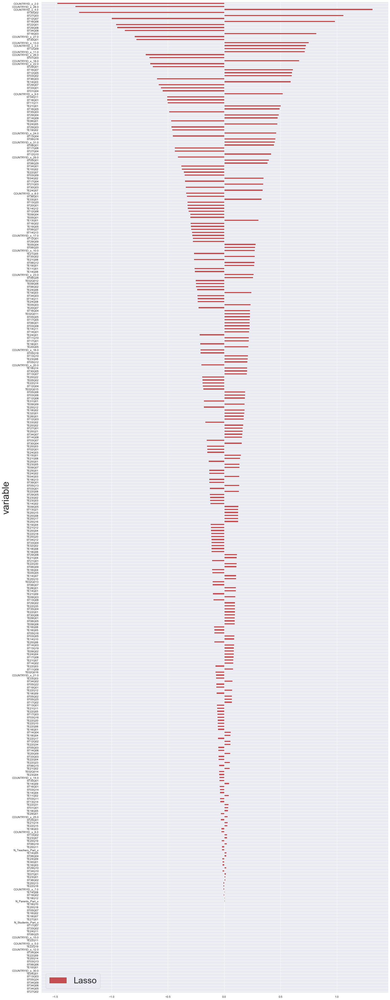

In [433]:
#Examine coefficients for group 2 (highest confidence group)
coefs_vars = pd.DataFrame({
    'coef': model_e.coef_[0],
    'variable': X4.columns,
    'abscoef': np.abs(model_e.coef_[0])
})
coefs_vars.sort_values('abscoef', ascending=True, inplace=True)
coefs_vars.plot(kind='barh', x='variable', y='coef',
                      color='r', figsize=(20, 50), label='Lasso', fontsize=10)

plt.tight_layout()
plt.show()

The following teacher variables are associated with being in class 1 (the higher confidence class):

TE14Q09- Positive: Undertaken Advanced courses on Internet use (creating websites/webpages, video conferencing, etc.) in the past two years

TE21Q01- Positive: To what extent do the following apply to you, when it comes to teaching methods and practices (with or without ICT)? I present/demonstrate to the entire class

TE06Q01 - Negative: For how many years have you been using computers and/or the Internet at any school? Less than one year

TE24Q05- Positive: To what extent do you agree with the following statement: ICT use in teaching and learning positively impacts on students’ motivation